## Лабораторная работа №1: Геометрические преобразования изображений
Выполнила студентка гр. 8383 Сырцова Екатерина

## Задача:
Реализовать на языке Python  с использованием библиотеки OpenCV программу, выполняющее геометрические преобразования изображения
### Входные данные:
1.	цветное изображение в формате bmp, jpg
2.	угол поворота $\alpha \in [0...360)$ - целое число
3.	коэффициент $k \in (0...1]$ - рациональное число
4.	признак используемой интерполяционной схемы (0 – нулевого порядка, 1 – первого порядка, 2- третьего порядка).
### Выходные данные
Цветное изображение в формате bmp (result.bmp), являющиеся результатом следующих пребразований:
1.	Исходное избражение поворачивается на $\alpha$ градусов против часовой стрелке
2.	Из получившегося изображения вырезается прямоугольник максимальной площади, вписаный в повернутое изображение
3.	Данное изображение увеличивается по оси $Y$ в $\frac{1}{k}$ раз и уменьшается по оси $Х$ в $k$ раз.
4.	Результат с использванием интерполяции соответствующего порядка записывается в файл result.bmp

## Выполнение работы

1. Считаем входное цветное изображение в формате jpg из папки:

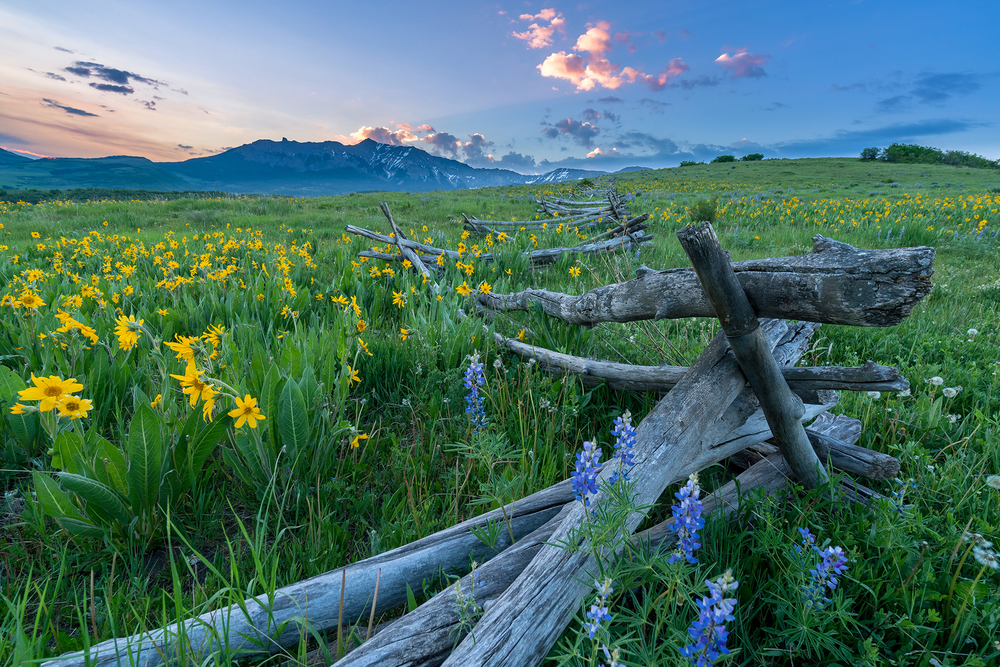

In [2]:
import cv2 as cv2
from math import sin, cos, radians
from IPython.display import display
from PIL import Image

image = cv2.imread('1.jpg', cv2.IMREAD_COLOR)
display(Image.fromarray(cv2.cvtColor(image, cv2.COLOR_BGR2RGB)))

2. Повернем исходное изображение против часовой стрелки, для примера $\alpha = 210$:

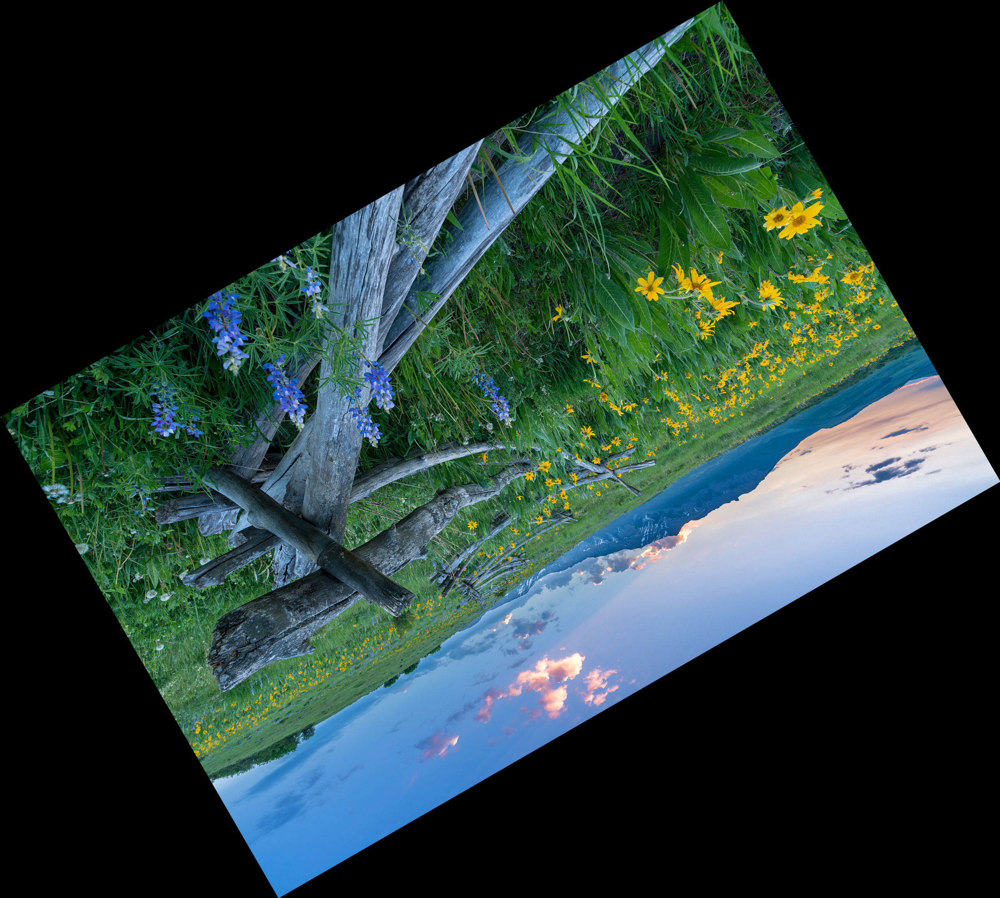

In [3]:
def rotate_image(mat, angle):
    height, width = mat.shape[:2]
    image_center = (width / 2, height / 2)
    rotation_mat = cv2.getRotationMatrix2D(image_center, angle, 1.)
    abs_cos = abs(rotation_mat[0, 0])
    abs_sin = abs(rotation_mat[0, 1])
    bound_w = int(height * abs_sin + width * abs_cos)
    bound_h = int(height * abs_cos + width * abs_sin)
    rotation_mat[0, 2] += bound_w / 2 - image_center[0]
    rotation_mat[1, 2] += bound_h / 2 - image_center[1]
    rotated_mat = cv2.warpAffine(mat, rotation_mat, (bound_w, bound_h))
    return rotated_mat


alpha = -1
while alpha < 0 or alpha >= 360:
    alpha = float(input("Введите угол поворота изображения:\n"))
rot_image = rotate_image(image, alpha)
display(Image.fromarray(cv2.cvtColor(rot_image, cv2.COLOR_BGR2RGB)))

3. Из получившегося изображения вырежем прямоугольник максимальной площади, вписанный в повернутое изображение:

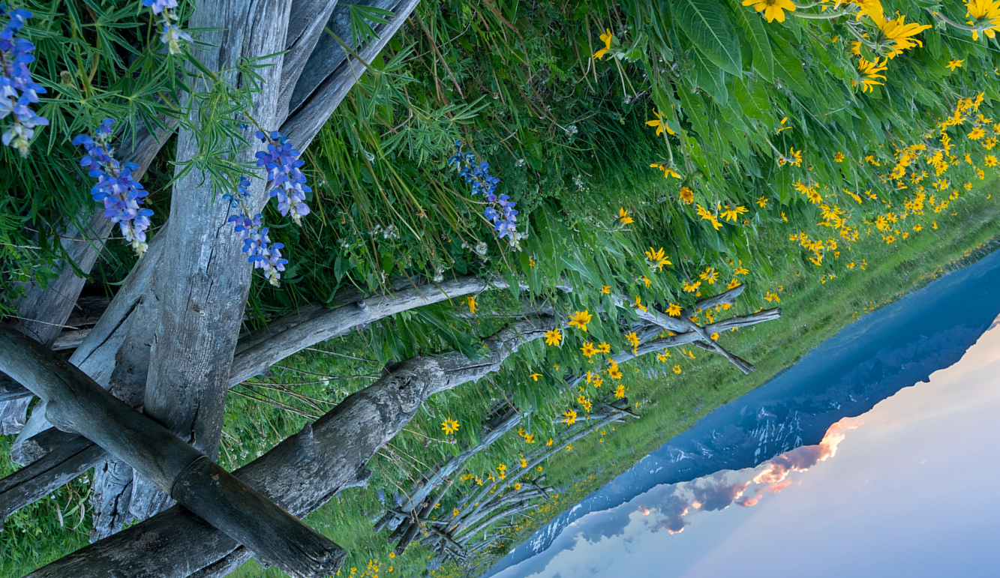

In [4]:
def get_xy(image, alpha):
    h, w, _ = image.shape
    s = h if h < w else w
    l = w if h < w else h
    if s <= sin(2 * alpha) * l or abs(sin(alpha) - cos(alpha)) < 1e-10:
        x, y = 0.5 * s / sin(alpha), 0.5 * s / cos(alpha)
    else:
        x, y = (w * cos(alpha) - h * sin(alpha)) / cos(2 * alpha), (h * cos(alpha) - w * sin(alpha)) / cos(2 * alpha)
    return abs(y), abs(x)


h, w, _ = rot_image.shape
y, x = get_xy(image, radians(alpha))
crop_image = rot_image[round((h - y) / 2):round((h + y) / 2), round((w - x) / 2):round((w + x) / 2)]
display(Image.fromarray(cv2.cvtColor(crop_image, cv2.COLOR_BGR2RGB)))

4. Данное изображение увеличиваем по оси $Y$ в $\frac{1}{k}$ раз и уменьшаем по оси $Х$ в $k$ раз с использованием интерполяции разного порядка, для примера $k = 0.4$ используется бикубическая интерполяция, полученное изображение сохраним в файл с именем result.bmp:

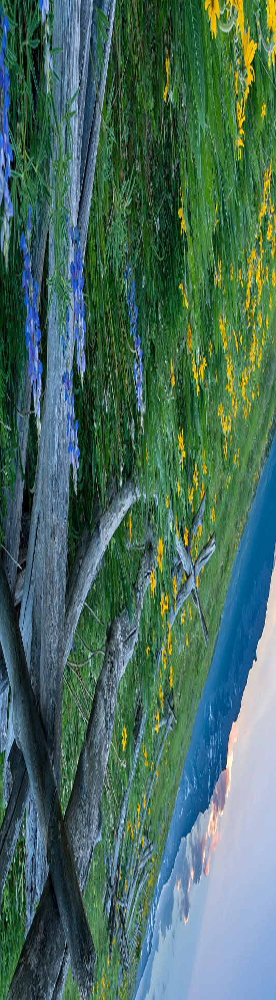

True

In [5]:
h, w, _ = crop_image.shape
k = -1
while k <= 0 or k > 1:
    k = float(input("Введите коэффициент k:\n"))
interpolate = -1
while interpolate not in [0, 1, 2]:
    interpolate = int(input("Введите используемый признак интерполяции (0 – нулевого порядка, 1 – первого порядка, 2- третьего порядка):\n"))
array = [cv2.INTER_NEAREST, cv2.INTER_LINEAR, cv2.INTER_CUBIC]
result = cv2.resize(crop_image, (int(w * k), int(h / k)), interpolation=array[interpolate])
display(Image.fromarray(cv2.cvtColor(result, cv2.COLOR_BGR2RGB)))
cv2.imwrite("result.bmp", result)

## Выводы
В процессе выполнения данной лабораторной работы были изучены методы интерполяции: метод ближайшего соседа, билинейная интерполяция, бикубическая интерполяция. Была написана программа на языке Python, реализующая, поставленную задачу, а также проведено тестирование на различных параметрах (угол поворота, метод интерполяции и коэффициент k). По результатам проведённых тестов видно, что метод ближайшего соседа сильнее ухудшает качество изображения, а бикубическая интерполяция даёт наиболее качественный результат.
